In [1]:
import os
import sys
import random
import time
from random import seed, randint
import argparse
import platform
from datetime import datetime
import imp
import numpy as np
import fileinput
from itertools import product
import pandas as pd
from scipy.interpolate import griddata
from scipy.interpolate import interp2d
import seaborn as sns
from os import listdir

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.interpolate import griddata
import matplotlib as mpl
# sys.path.insert(0,'..')
# from notebookFunctions import *
# from .. import notebookFunctions

from Bio.PDB.PDBParser import PDBParser
from pyCodeLib import *
%matplotlib inline
# plt.rcParams['figure.figsize'] = (10,6.180)    #golden ratio
# %matplotlib notebook
%load_ext autoreload
%autoreload 2

In [2]:
plt.rcParams['figure.figsize'] = [16.18033, 10]    #golden ratio
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams['figure.dpi'] = 100

In [3]:
data = pd.read_csv("/Users/weilu/Research/data/survey_represent_x_com_complete.csv", index_col=0)

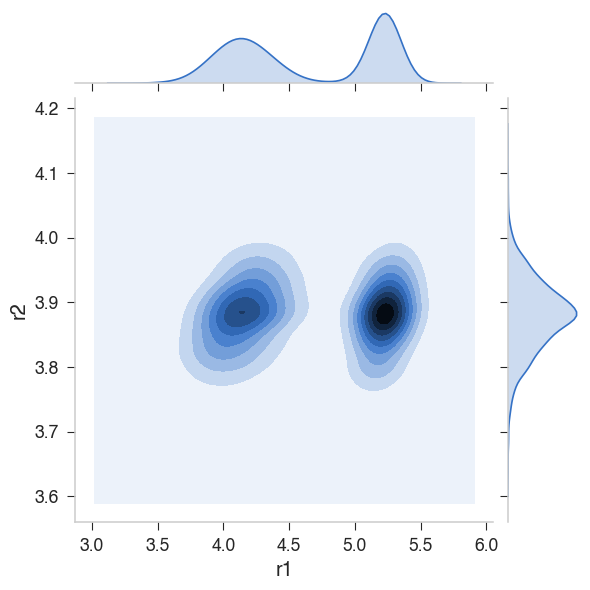

In [4]:
data_res = data.query("ResName == 'TYR'").reset_index(drop=True)
sns.jointplot("r1", "r2", kind="kde", data=data_res)
# plt.show()

In [5]:
import plotly.express as px

In [6]:
fig = px.scatter_3d(data_res, x='r1', y='r2', z='r3', color="r")
fig.show()

In [10]:
X = data_res[["r1", "r2", "r3"]].values

from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3)
kmeans.fit(X)
y_kmeans = kmeans.predict(X)

In [15]:
data_res["predicted"] = y_kmeans

In [45]:
fig = px.scatter_3d(data_res, x='r1', y='r2', z='r3', opacity=0.02)
fig.add_scatter3d(x=kmeans.cluster_centers_[:,0], y=kmeans.cluster_centers_[:,1], z=kmeans.cluster_centers_[:,2])
fig.show()

In [5]:
X = data_res[["r1", "r2", "r3"]].values
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=3).fit(X)
labels = gmm.predict(X)

In [6]:
gmm.covariances_

array([[[ 0.00289093,  0.00220976,  0.00098427],
        [ 0.00220976,  0.0030833 ,  0.00477244],
        [ 0.00098427,  0.00477244,  0.03741773]],

       [[ 0.03945493,  0.00484687, -0.00370831],
        [ 0.00484687,  0.00319935,  0.00227712],
        [-0.00370831,  0.00227712,  0.00429153]],

       [[ 0.06486049,  0.00546383, -0.04913508],
        [ 0.00546383,  0.00289318,  0.00341033],
        [-0.04913508,  0.00341033,  0.07603875]]])

In [9]:
pc = gmm.precisions_cholesky_

In [15]:
1/gmm.covariances_

array([[[ 345.90946024,  452.53879933, 1015.97861812],
        [ 452.53879933,  324.32787309,  209.53631185],
        [1015.97861812,  209.53631185,   26.72529802]],

       [[  25.34537362,  206.31882585, -269.66487862],
        [ 206.31882585,  312.56365561,  439.15160653],
        [-269.66487862,  439.15160653,  233.01693996]],

       [[  15.41770569,  183.02169154,  -20.35205635],
        [ 183.02169154,  345.63987873,  293.22691319],
        [ -20.35205635,  293.22691319,   13.15118987]]])

In [14]:
pc[0].dot(pc[0].T)

array([[ 901.20971099, -759.03861429,   73.10523653],
       [-759.03861429, 1043.40177074, -113.11412853],
       [  73.10523653, -113.11412853,   39.22940183]])

In [18]:
pc[0].T.dot(pc[0])

array([[ 345.90946024, -380.73482187,  217.08202464],
       [-380.73482187, 1136.31460705, -722.60357473],
       [ 217.08202464, -722.60357473,  501.61681627]])

In [17]:
pc

array([[[ 18.59864135, -20.4711094 ,  11.67192918],
        [  0.        ,  26.7814915 , -18.05971993],
        [  0.        ,   0.        ,   6.26333791]],

       [[  5.0344189 ,  -2.40738223,   6.79789195],
        [  0.        ,  19.59680227, -32.00419269],
        [  0.        ,   0.        ,  30.49647854]],

       [[  3.92653864,  -1.70786655,   8.21358263],
        [  0.        ,  20.27387412, -25.01316343],
        [  0.        ,   0.        ,   8.06082409]]])

In [16]:
gmm.precisions_

array([[[ 901.20971099, -759.03861429,   73.10523653],
        [-759.03861429, 1043.40177074, -113.11412853],
        [  73.10523653, -113.11412853,   39.22940183]],

       [[  77.35219785, -264.7380376 ,  207.31176607],
        [-264.7380376 , 1408.3030094 , -976.01517562],
        [ 207.31176607, -976.01517562,  930.0352032 ]],

       [[  85.79745344, -240.07275608,   66.2082447 ],
        [-240.07275608, 1036.68831688, -201.62671028],
        [  66.2082447 , -201.62671028,   64.97688496]]])

In [ ]:
gmm.pr

In [223]:
gmm.means_

array([[5.22568112, 3.87951258, 4.01458734],
       [4.1477059 , 3.87660711, 5.26290152],
       [4.15129429, 3.9084444 , 4.11559124]])

In [228]:
x = np.array([[1,2,3]]).T
m = gmm.means_[0]
sigma = gmm.covariances_[0]


In [232]:
gmm.precisions_cholesky_

array([[[ 18.59864135, -20.4711094 ,  11.67192918],
        [  0.        ,  26.7814915 , -18.05971993],
        [  0.        ,   0.        ,   6.26333791]],

       [[  5.0344189 ,  -2.40738223,   6.79789195],
        [  0.        ,  19.59680227, -32.00419269],
        [  0.        ,   0.        ,  30.49647854]],

       [[  3.92653864,  -1.70786655,   8.21358263],
        [  0.        ,  20.27387412, -25.01316343],
        [  0.        ,   0.        ,   8.06082409]]])

In [ ]:
def _estimate_log_prob(self, X):
    return _estimate_log_gaussian_prob(
        X, self.means_, self.precisions_cholesky_, self.covariance_type)

# Gaussian mixture probability estimators
def _compute_log_det_cholesky(matrix_chol, covariance_type, n_features):
    """Compute the log-det of the cholesky decomposition of matrices.
    Parameters
    ----------
    matrix_chol : array-like
        Cholesky decompositions of the matrices.
        'full' : shape of (n_components, n_features, n_features)
        'tied' : shape of (n_features, n_features)
        'diag' : shape of (n_components, n_features)
        'spherical' : shape of (n_components,)
    covariance_type : {'full', 'tied', 'diag', 'spherical'}
    n_features : int
        Number of features.
    Returns
    -------
    log_det_precision_chol : array-like, shape (n_components,)
        The determinant of the precision matrix for each component.
    """
    if covariance_type == 'full':
        n_components, _, _ = matrix_chol.shape
        log_det_chol = (np.sum(np.log(
            matrix_chol.reshape(
                n_components, -1)[:, ::n_features + 1]), 1))

    elif covariance_type == 'tied':
        log_det_chol = (np.sum(np.log(np.diag(matrix_chol))))

    elif covariance_type == 'diag':
        log_det_chol = (np.sum(np.log(matrix_chol), axis=1))

    else:
        log_det_chol = n_features * (np.log(matrix_chol))

    return log_det_chol

def _estimate_log_gaussian_prob(X, means, precisions_chol, covariance_type):
    """Estimate the log Gaussian probability.
    Parameters
    ----------
    X : array-like, shape (n_samples, n_features)
    means : array-like, shape (n_components, n_features)
    precisions_chol : array-like
        Cholesky decompositions of the precision matrices.
        'full' : shape of (n_components, n_features, n_features)
        'tied' : shape of (n_features, n_features)
        'diag' : shape of (n_components, n_features)
        'spherical' : shape of (n_components,)
    covariance_type : {'full', 'tied', 'diag', 'spherical'}
    Returns
    -------
    log_prob : array, shape (n_samples, n_components)
    """
    n_samples, n_features = X.shape
    n_components, _ = means.shape
    # det(precision_chol) is half of det(precision)
    log_det = _compute_log_det_cholesky(
        precisions_chol, covariance_type, n_features)

    if covariance_type == 'full':
        log_prob = np.empty((n_samples, n_components))
        for k, (mu, prec_chol) in enumerate(zip(means, precisions_chol)):
            y = np.dot(X, prec_chol) - np.dot(mu, prec_chol)
            log_prob[:, k] = np.sum(np.square(y), axis=1)

    elif covariance_type == 'tied':
        log_prob = np.empty((n_samples, n_components))
        for k, mu in enumerate(means):
            y = np.dot(X, precisions_chol) - np.dot(mu, precisions_chol)
            log_prob[:, k] = np.sum(np.square(y), axis=1)

    elif covariance_type == 'diag':
        precisions = precisions_chol ** 2
        log_prob = (np.sum((means ** 2 * precisions), 1) -
                    2. * np.dot(X, (means * precisions).T) +
                    np.dot(X ** 2, precisions.T))

    elif covariance_type == 'spherical':
        precisions = precisions_chol ** 2
        log_prob = (np.sum(means ** 2, 1) * precisions -
                    2 * np.dot(X, means.T * precisions) +
                    np.outer(row_norms(X, squared=True), precisions))
    return -.5 * (n_features * np.log(2 * np.pi) + log_prob) + log_det

def score_samples(self, X):
    """Compute the weighted log probabilities for each sample.
    Parameters
    ----------
    X : array-like, shape (n_samples, n_features)
        List of n_features-dimensional data points. Each row
        corresponds to a single data point.
    Returns
    -------
    log_prob : array, shape (n_samples,)
        Log probabilities of each data point in X.
    """
    check_is_fitted(self)
    X = _check_X(X, None, self.means_.shape[1])

    return logsumexp(self._estimate_weighted_log_prob(X), axis=1)


    def _estimate_weighted_log_prob(self, X):
        """Estimate the weighted log-probabilities, log P(X | Z) + log weights.
        Parameters
        ----------
        X : array-like, shape (n_samples, n_features)
        Returns
        -------
        weighted_log_prob : array, shape (n_samples, n_component)
        """
        return self._estimate_log_prob(X) + self._estimate_log_weights()
    
    def _estimate_log_prob(self, X):
        """Estimate the log-probabilities log P(X | Z).
        Compute the log-probabilities per each component for each sample.
        Parameters
        ----------
        X : array-like, shape (n_samples, n_features)
        Returns
        -------
        log_prob : array, shape (n_samples, n_component)
        """
        pass
    
    def _estimate_log_weights(self):
        """Estimate log-weights in EM algorithm, E[ log pi ] in VB algorithm.
        Returns
        -------
        log_weight : array, shape (n_components, )
        """
        pass
    
    def _estimate_log_weights(self):
        return np.log(self.weights_)

In [ ]:
def _compute_log_det_cholesky(matrix_chol, covariance_type, n_features):
    """Compute the log-det of the cholesky decomposition of matrices.
    Parameters
    ----------
    matrix_chol : array-like
        Cholesky decompositions of the matrices.
        'full' : shape of (n_components, n_features, n_features)
        'tied' : shape of (n_features, n_features)
        'diag' : shape of (n_components, n_features)
        'spherical' : shape of (n_components,)
    covariance_type : {'full', 'tied', 'diag', 'spherical'}
    n_features : int
        Number of features.
    Returns
    -------
    log_det_precision_chol : array-like, shape (n_components,)
        The determinant of the precision matrix for each component.
    """
    if covariance_type == 'full':
        n_components, _, _ = matrix_chol.shape
        log_det_chol = (np.sum(np.log(
            matrix_chol.reshape(
                n_components, -1)[:, ::n_features + 1]), 1))

    return log_det_chol

In [253]:
gmm.means_.shape

(3, 3)

In [299]:
gmm.means_

array([[5.22568112, 3.87951258, 4.01458734],
       [4.1477059 , 3.87660711, 5.26290152],
       [4.15129429, 3.9084444 , 4.11559124]])

In [300]:
gmm.score_samples(gmm.means_)

array([4.5064429 , 4.52522597, 0.88353589])

In [301]:
gmm.weights_

array([0.45737378, 0.48324372, 0.0593825 ])

In [283]:
precisions_chol = gmm.precisions_cholesky_
means = gmm.means_
log_prob = np.empty((n_samples, n_components))
for k, (mu, prec_chol) in enumerate(zip(means, precisions_chol)):
    y = np.dot(x, prec_chol) - np.dot(mu, prec_chol)
    log_prob[:, k] = np.sum(np.square(y), axis=1)

In [284]:
-.5 * (n_features * np.log(2 * np.pi) + log_prob) + log_det

array([[-3973.29074742, -1007.09479573,  -710.30321622]])

array([-3973.29074742, -1007.09479573,  -710.30321622])

In [269]:
log_prob[0]

(1, 3)

In [271]:
y = np.dot(x, precisions_chol[0]) - np.dot(gmm.means_[0], precisions_chol[0])
np.sum(np.square(y), axis=1)

array([7957.15888929])

In [360]:
x = np.array([[5.22568112, 3.87951258, 4.01458734]])
x = np.array([[4.7, 3.9, 8]])
x = np.array([[4.7, 3.9, 7]])

In [349]:
X.max(axis=0)

array([5.46133935, 4.14118887, 5.53369196])

In [365]:
x = X.max(axis=0).reshape(1,3)
# x = np.array([[5.22568112, 3.87951258, 4.01458734]])

array([[5.22568112, 3.87951258, 4.01458734],
       [4.1477059 , 3.87660711, 5.26290152],
       [4.15129429, 3.9084444 , 4.11559124]])

In [377]:
means = gmm.means_

In [366]:
n_samples, n_features = x.shape
matrix_chol = gmm.precisions_cholesky_
n_components, _ = gmm.means_.shape
n_components, _, _ = matrix_chol.shape
log_det_chol = (np.sum(np.log(
    matrix_chol.reshape(
        n_components, -1)[:, ::n_features + 1]), 1))
log_det = log_det_chol

mean_dot_precisions_chol = np.zeros((3,3))
log_prob = np.zeros(3)
for i in range(n_components):
    mean_dot_precisions_chol[i] = np.dot(gmm.means_[i], precisions_chol[i])
    y = np.dot(x, precisions_chol[i]) - mean_dot_precisions_chol[i]
    log_prob[i] = np.sum(np.square(y))
    
log_gaussian_prob = -.5 * (n_features * np.log(2 * np.pi) + log_prob) + log_det

score = np.log(np.sum(np.exp(log_gaussian_prob + np.log(gmm.weights_))))
kt = 1
E_side_chain = -score*kt

print(E_side_chain)

35.90492633763506


In [383]:
def compute_side_chain_energy_for_x(x, means, precisions_chol, log_det):
    n_samples, n_features = x.shape
    n_components, _ = means.shape

    mean_dot_precisions_chol = np.zeros((3,3))
    log_prob = np.zeros(3)
    for i in range(n_components):
        mean_dot_precisions_chol[i] = np.dot(means[i], precisions_chol[i])
        y = np.dot(x, precisions_chol[i]) - mean_dot_precisions_chol[i]
        log_prob[i] = np.sum(np.square(y))

    log_gaussian_prob = -.5 * (n_features * np.log(2 * np.pi) + log_prob) + log_det

    score = np.log(np.sum(np.exp(log_gaussian_prob + np.log(gmm.weights_))))
    kt = 1
    E_side_chain = -score*kt
    # print(E_side_chain)
    return E_side_chain

In [384]:
compute_side_chain_energy_for_x(x, means, precisions_chol, log_det)

35.90492633763506

In [385]:
x

array([[5.46133935, 4.14118887, 5.53369196]])

In [367]:
log_gaussian_prob + np.log(gmm.weights_)

array([ -35.90492634,  -57.41091197, -149.40589214])

In [373]:
np.log(np.sum(np.exp(np.array([0,-10, -10]))))

9.079573746725622e-05

In [374]:
np.log(np.sum(np.exp(np.array([0,0, -10]))))

0.6931698802671862

In [372]:
np.exp(np.array([1e-3,1e-10, 1e-10]))

array([1.0010005, 1.       , 1.       ])

In [370]:
np.sum(np.exp(np.array([1e-3,1e-10, 1e-10])))

3.0010005003667084

In [344]:
log_gaussian_prob + np.log(gmm.weights_)

array([ -110283.22064057, -2604273.10594069,  -189982.03657247])

In [323]:
log_gaussian_prob

array([ -7627311.16605359, -53149974.99266396,  -7925574.8941635 ])

In [310]:
log_gaussian_prob + np.log(gmm.weights_)

array([   4.5064429 , -488.79635896,  -49.08856454])

In [316]:
precisions_chol

array([[[ 18.59864135, -20.4711094 ,  11.67192918],
        [  0.        ,  26.7814915 , -18.05971993],
        [  0.        ,   0.        ,   6.26333791]],

       [[  5.0344189 ,  -2.40738223,   6.79789195],
        [  0.        ,  19.59680227, -32.00419269],
        [  0.        ,   0.        ,  30.49647854]],

       [[  3.92653864,  -1.70786655,   8.21358263],
        [  0.        ,  20.27387412, -25.01316343],
        [  0.        ,   0.        ,   8.06082409]]])

In [313]:
np.log(np.sum(np.exp(np.array([0,0,-40]))))

0.6931471805599453

In [298]:
log_gaussian_prob + np.log(gmm.weights_)

array([-3974.07300175, -1007.82202989,  -713.12697188])

In [293]:
np.sum(np.exp(log_gaussian_prob + np.log(gmm.weights_)))

1.9628685536941e-310

In [281]:
log_prob

array([7957.15888929, 2024.69451172, 1428.02101553])

In [274]:
np.sum(np.square(y), axis=1)

array([7957.15888929])

In [270]:
log_prob

array([[7957.15888929, 2024.69451172, 1428.02101553]])

In [ ]:
n_components, _, _ = matrix_chol.shape
log_det_chol = (np.sum(np.log(
    matrix_chol.reshape(
        n_components, -1)[:, ::n_features + 1]), 1))


In [235]:
x = np.array([[1,2,3]])

In [240]:
from scipy.special import logsumexp

In [241]:
logsumexp(gmm._estimate_log_prob(x) + gmm._estimate_log_weights(), axis=1)

array([-713.12697188])

In [248]:
np.log(np.sum(np.exp(gmm._estimate_log_prob(x) + np.log(gmm.weights_))))

-713.1269718770509

In [291]:
np.log(np.sum(np.exp(log_gaussian_prob + np.log(gmm.weights_))))

-713.1269718770509

In [290]:
np.log(gmm.weights_)

array([-0.78225432, -0.72723416, -2.82375566])

In [249]:
gmm._estimate_log_prob(x)

array([[-3973.29074742, -1007.09479573,  -710.30321622]])

In [250]:
np.log(gmm.weights_)

array([-0.78225432, -0.72723416, -2.82375566])

In [245]:
np.exp(gmm._estimate_log_prob(x) + gmm._estimate_log_weights())

array([[0.00000000e+000, 0.00000000e+000, 1.96286855e-310]])

In [242]:
gmm.score([[1,2,3]])

-713.1269718770509

In [ ]:
log_prob = np.empty((n_samples, n_components))
for k, (mu, prec_chol) in enumerate(zip(means, precisions_chol)):
    y = np.dot(X, prec_chol) - np.dot(mu, prec_chol)
    log_prob[:, k] = np.sum(np.square(y), axis=1)

In [231]:
(x-m).T.dot(np.linalg.inv(sigma)).dot(x-m)

array([[6201.77602469, 4235.90014669, 4433.15643657],
       [4235.90014669, 2969.06126271, 3096.17607241],
       [4433.15643657, 3096.17607241, 3230.32888909]])

In [230]:
np.linalg.inv(sigma)

array([[ 901.20971099, -759.03861429,   73.10523653],
       [-759.03861429, 1043.40177074, -113.11412853],
       [  73.10523653, -113.11412853,   39.22940183]])

In [229]:
sigma.shape

(3, 3)

In [227]:
x.shape

(3, 1)

In [219]:
sampled = gmm.sample(10000)[0]
sampled = pd.DataFrame(sampled, columns=["r1", "r2", "r3"])

In [220]:
fig = px.scatter_3d(sampled, x='r1', y='r2', z='r3', opacity=0.02)
fig.show()

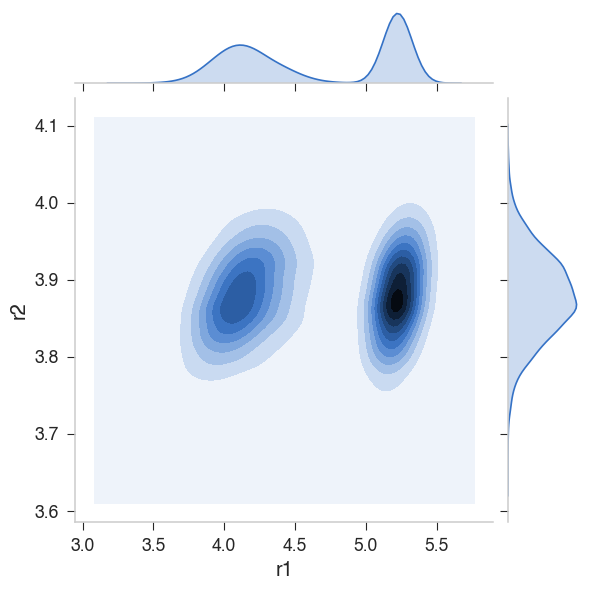

In [209]:
sns.jointplot("r1", "r2", kind="kde", data=sampled)

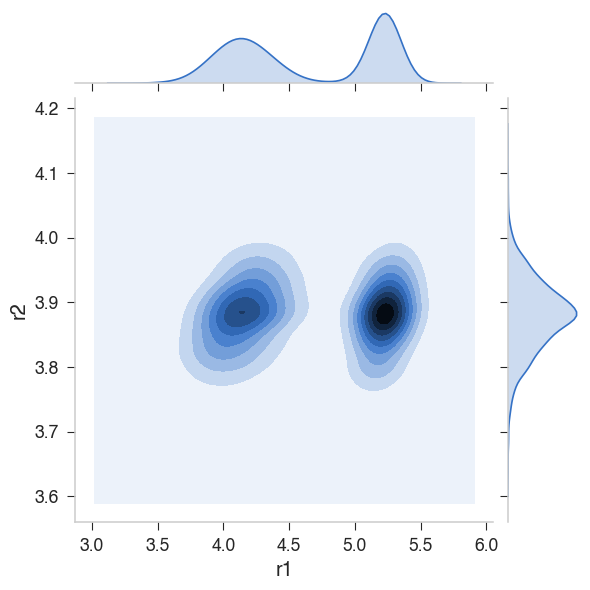

In [188]:
sns.jointplot("r1", "r2", kind="kde", data=data_res)

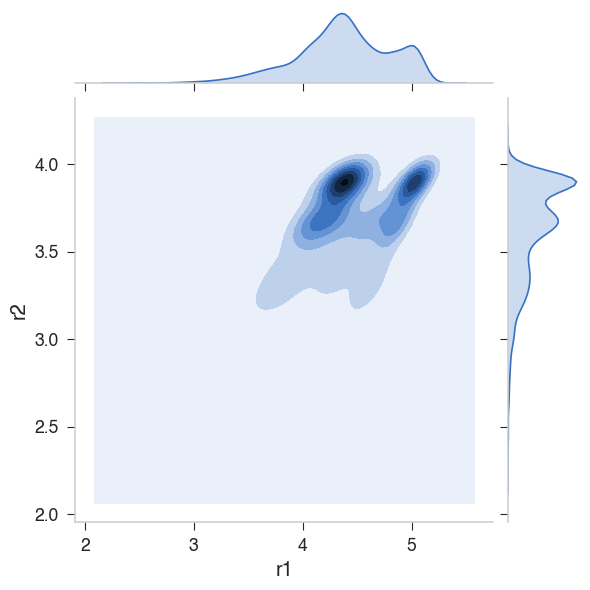

In [48]:
data_lys = data.query("ResName == 'LYS'").reset_index(drop=True)
sns.jointplot("r1", "r2", kind="kde", data=data_lys)
# plt.show()

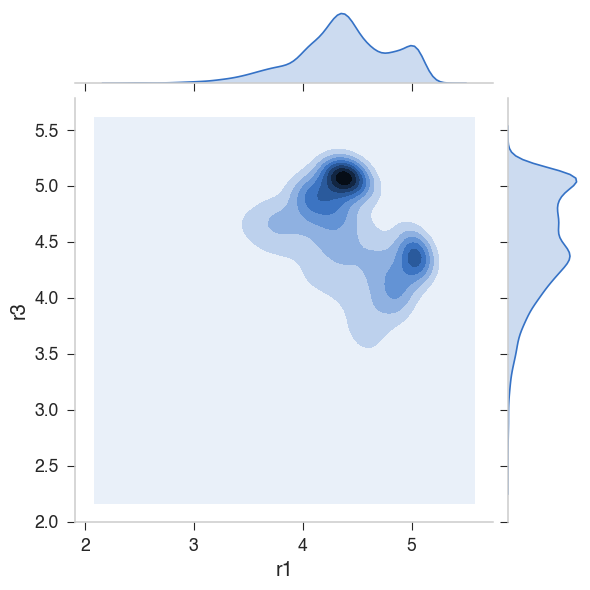

In [50]:
data_lys = data.query("ResName == 'LYS'").reset_index(drop=True)
sns.jointplot("r1", "r3", kind="kde", data=data_lys)
# plt.show()

In [58]:
X_lys = data_lys[["r1", "r2", "r3"]].values

from sklearn.cluster import KMeans
kmeans_lys = KMeans(n_clusters=3)
kmeans_lys.fit(X)
y_kmeans = kmeans_lys.predict(X_lys)

In [165]:

from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=3).fit(X_lys)
labels = gmm.predict(X_lys)


min_x = X_lys.min(axis=0)
max_x = X_lys.max(axis=0)
n = 50
r1 = np.linspace(min_x[0], max_x[0], n)
r2 = np.linspace(min_x[1], max_x[1], n)
r3 = np.linspace(min_x[2], max_x[2], n)

xx, yy, zz = np.meshgrid(r1, r2, r3)

d_ = np.zeros((n**3, 4))
d_[:,0] = xx.flatten()
d_[:,1] = yy.flatten()
d_[:,2] = zz.flatten()
d_[:,3] = gmm.score_samples(d_[:,:3])

d = pd.DataFrame(d_, columns=["r1", "r2", "r3", "score"])
d_filtered = d.query("score > 0")


fig = px.scatter_3d(d_filtered, x='r1', y='r2', z='r3', color="score")
fig.show()

In [173]:
fig = px.scatter_3d(d_filtered, x='r1', y='r2', z='r3', color="score")
fig.show()

(array([  1.,   0.,   1.,   0.,   1.,   1.,   1.,   0.,   0.,   0.,   1.,
          2.,   2.,   2.,   1.,   3.,   0.,   2.,   3.,   3.,   2.,   5.,
          7.,   6.,   4.,  10.,   5.,  12.,  16.,  13.,  31.,  32.,  50.,
         85., 122., 163., 189., 297., 532., 749., 343., 133., 193., 205.,
        235., 368., 496., 332., 392., 179.]),
 array([-15.54486776, -15.16409846, -14.78332915, -14.40255984,
        -14.02179053, -13.64102122, -13.26025192, -12.87948261,
        -12.4987133 , -12.11794399, -11.73717469, -11.35640538,
        -10.97563607, -10.59486676, -10.21409745,  -9.83332815,
         -9.45255884,  -9.07178953,  -8.69102022,  -8.31025092,
         -7.92948161,  -7.5487123 ,  -7.16794299,  -6.78717368,
         -6.40640438,  -6.02563507,  -5.64486576,  -5.26409645,
         -4.88332715,  -4.50255784,  -4.12178853,  -3.74101922,
         -3.36024991,  -2.97948061,  -2.5987113 ,  -2.21794199,
         -1.83717268,  -1.45640338,  -1.07563407,  -0.69486476,
         -0.314095

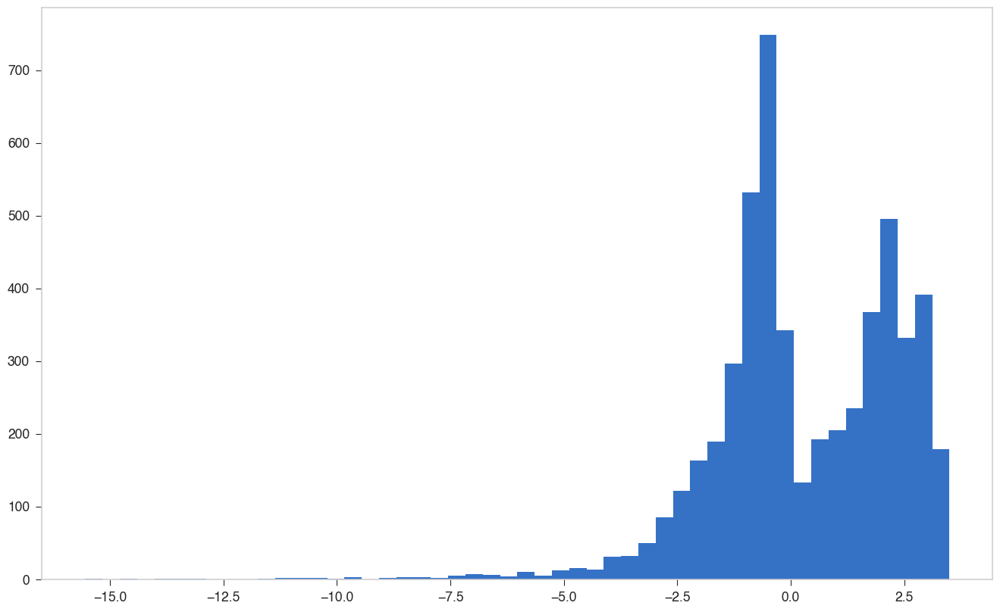

In [136]:
plt.hist(gmm.score_samples(X_lys), bins=50)

In [134]:
gmm.score_samples(X_lys)

array([-0.74202584, -1.45329625,  2.36560947, ...,  1.2158689 ,
        1.65569531, -2.66455865])

In [118]:
prob = np.array(score_list).reshape(n,n,n)

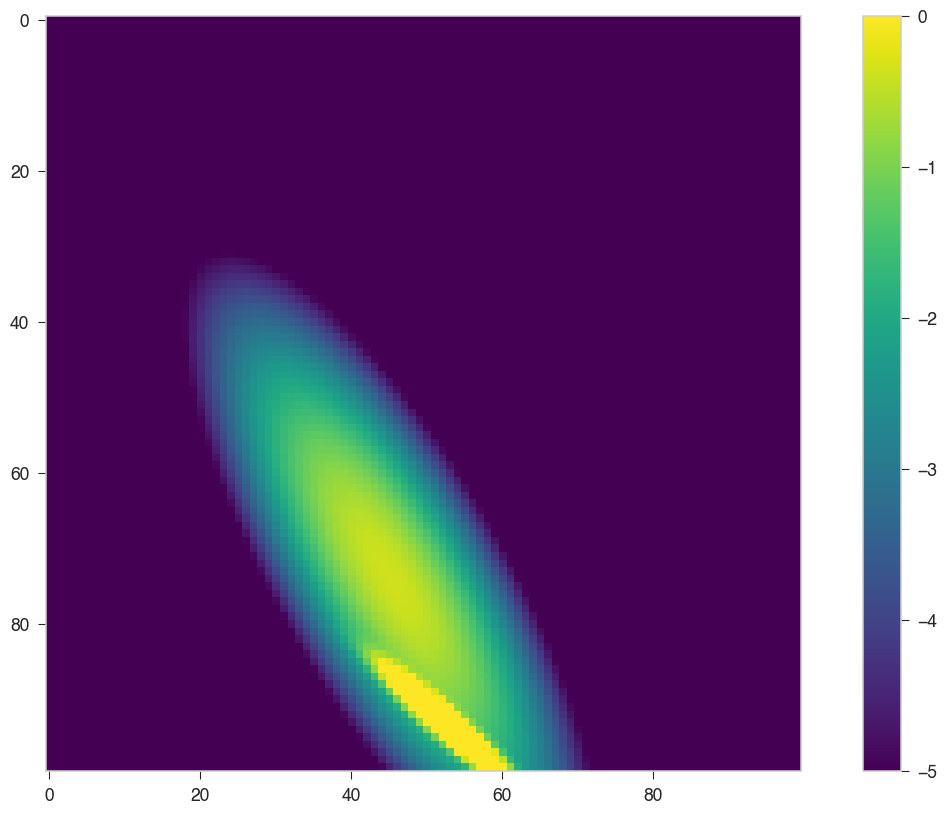

In [112]:
plt.imshow(prob)
plt.clim([-5, 0])
plt.colorbar()

In [ ]:
r1 = np.linspace(2, 5, 100)
r2 = np.linspace(2, 5, 100)
r3 = np.linspace(2, 5, 100)

score_list = []
for r1_ in r1:
    for r2_ in r2:
            score = gmm.score([[r1_, r2_, r3_]])
            score_list.append(score)

In [88]:
gmm.score([[1,2,3]])

-44.924811181615404

In [89]:
gmm.predict_proba([[1,2,3]])

array([[0.00000000e+000, 1.00000000e+000, 8.78636648e-227]])

In [63]:
data_lys["predicted"] = labels

In [71]:
kernel = stats.gaussian_kde(X_lys)

In [74]:
kernel.weights

array([0.33333333, 0.33333333, 0.33333333])

In [75]:
from sklearn.neighbors import KernelDensity

In [76]:
kde = KernelDensity()

In [77]:
kde.fit(X_lys)

KernelDensity(algorithm='auto', atol=0, bandwidth=1.0, breadth_first=True,
       kernel='gaussian', leaf_size=40, metric='euclidean',
       metric_params=None, rtol=0)

In [85]:
kde.tree_

In [79]:
kde.score([[1,2,3]])

-9.160519807383077

In [59]:
fig = px.scatter_3d(data_lys, x='r1', y='r2', z='r3', opacity=0.02)
fig.add_scatter3d(x=kmeans_lys.cluster_centers_[:,0], y=kmeans_lys.cluster_centers_[:,1], z=kmeans_lys.cluster_centers_[:,2])
fig.show()

In [53]:
fig = px.scatter_3d(data_lys, x='r1', y='r2', z='r3', opacity=0.1)
fig.show()

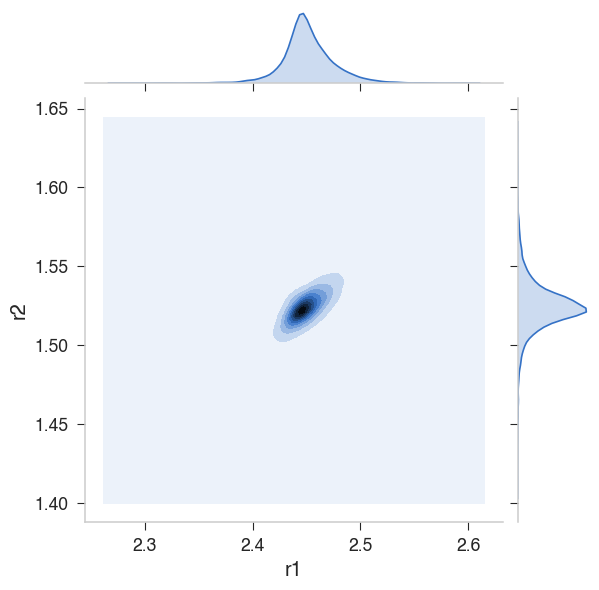

In [55]:
data_ala = data.query("ResName == 'ALA'").reset_index(drop=True)
sns.jointplot("r1", "r2", kind="kde", data=data_ala)
# plt.show()

In [56]:
fig = px.scatter_3d(data_ala, x='r1', y='r2', z='r3', color="r")
fig.show()

In [57]:
fig = px.scatter_3d(data_ala, x='r1', y='r2', z='r3', opacity=0.1)
fig.show()

In [23]:
res_set = {}
res_set['GLY'] = {'CA', 'N', 'O', 'C'}
res_set['ALA'] = {'CA', 'CB', 'N', 'O', 'C'}
res_set['VAL'] = {'CA', 'CB', 'CG2', 'CG1', 'N', 'O', 'C'}
res_set['CYS'] = {'CA', 'CB', 'SG', 'N', 'O', 'C'}
res_set['PRO'] = {'CA', 'CB', 'CG', 'CD', 'N', 'O', 'C'}
res_set['LEU'] = {'CD1', 'CA', 'CD2', 'CB', 'CG', 'N', 'O', 'C'}
res_set['ILE'] = {'CD1', 'CA', 'CB', 'CG2', 'CG1', 'N', 'O', 'C'}
res_set['MET'] = {'CA', 'CB', 'SD', 'CG', 'CE', 'N', 'O', 'C'}
res_set['TRP'] = {'CD1', 'CA', 'CZ3', 'NE1', 'CD2', 'CB', 'CG', 'CZ2', 'CH2', 'CE3', 'N', 'O', 'CE2', 'C'}
res_set['PHE'] = {'CD1', 'CA', 'CD2', 'CB', 'CE1', 'CG', 'CZ', 'N', 'O', 'CE2', 'C'}


res_set['SER'] = {'CA', 'OG', 'CB', 'N', 'O', 'C'}
res_set['THR'] = {'CA', 'CB', 'CG2', 'N', 'OG1', 'O', 'C'}
res_set['TYR'] = {'CD1', 'CA', 'CD2', 'CB', 'CE1', 'OH', 'CG', 'CZ', 'N', 'O', 'CE2', 'C'}
res_set["GLN"] = {'CA', 'CB', 'CG', 'CD', 'OE1', 'NE2', 'N', 'O', 'C'}
res_set['ASN'] = {'CA', 'OD1', 'CB', 'CG', 'ND2', 'N', 'O', 'C'}


res_set['LYS'] = {'CA', 'CB', 'CE', 'CG', 'CD', 'NZ', 'N', 'O', 'C'}
res_set['ARG'] = {'CA', 'NE', 'CB', 'CG', 'CD', 'NH2', 'CZ', 'NH1', 'N', 'O', 'C'}
res_set['HIS'] = {'CA', 'ND1', 'CD2', 'CB', 'CE1', 'CG', 'NE2', 'N', 'O', 'C'}


res_set['ASP'] = {'OD2', 'CA', 'OD1', 'CB', 'CG', 'N', 'O', 'C'}
res_set['GLU'] = {'CA', 'OE2', 'CB', 'CG', 'CD', 'OE1', 'N', 'O', 'C'}

def dis(a, b):
    return ((a[0]-b[0])**2 + (a[1]-b[1])**2 + (a[2]-b[2])**2)**0.5

def get_side_chain_center_of_mass(atoms):
    # ensure complete first
    total = np.array([0., 0., 0.])
    total_mass = 0
    for atom in atoms:
        if atom.get_name() in ["N", "CA", "C", "O"]:
            continue
        if atom.element == "H":
            continue
        total += atom.mass * atom.get_coord()
        total_mass += atom.mass
        # print(atom.get_name(), atom.get_coord())
    x_com = total / total_mass
    return x_com

def get_all_non_H_atoms(res):
    atoms = res.get_atoms()
    name_list = []
    for atom in atoms:
        name = atom.get_name()
        if atom.element == "H":
            continue
        name_list.append(name)
    return set(name_list)


def get_x_more_check(res, res_set=res_set):
    resName = res.get_resname()
    if resName == "GLY":
        x_com = res["CA"].get_coord()
    else:
        set_of_all_non_H_atoms = get_all_non_H_atoms(res)
        if set_of_all_non_H_atoms != res_set[resName]:
            print("atom not complete", set_of_all_non_H_atoms, "should be ", res_set[resName])
        x_com = get_side_chain_center_of_mass(res.get_atoms())
    
    n = res["N"].get_coord()
    ca = res["CA"].get_coord()
    c = res["C"].get_coord()

    A = np.zeros((3,3))
    A[:,0] = n
    A[:,1] = ca
    A[:,2] = c

    A_inv = np.linalg.inv(A)
    x = A_inv.dot(x_com)
    return x


def get_x(res):
    x_com = get_side_chain_center_of_mass(res.get_atoms())
    
    n = res["N"].get_coord()
    ca = res["CA"].get_coord()
    c = res["C"].get_coord()

    A = np.zeros((3,3))
    A[:,0] = n
    A[:,1] = ca
    A[:,2] = c

    A_inv = np.linalg.inv(A)
    x = A_inv.dot(x_com)
    return x

def get_x_with_regularization(res, alpha=0.001):
    x_com = get_side_chain_center_of_mass(res.get_atoms())
    
    n = res["N"].get_coord()
    ca = res["CA"].get_coord()
    c = res["C"].get_coord()

    A = np.zeros((3,3))
    A[:,0] = n
    A[:,1] = ca
    A[:,2] = c

    # A_inv = np.linalg.inv(A)
    # x = A_inv.dot(x_com)
    # return x
    A_inv_regularized = np.linalg.inv(A.T.dot(A) + alpha*np.eye(3)).dot(A.T)
    x_regularized = A_inv_regularized.dot(x_com)
    r = dis(A.dot(x_regularized), x_com)
    return x_regularized, r


def get_x_vector_based(res, alpha=0.001):
    n = res["N"].get_coord()
    ca = res["CA"].get_coord()
    c = res["C"].get_coord()

    x_com = get_side_chain_center_of_mass(res.get_atoms())
    ca_x_com = x_com - ca

    n_ca = ca - n
    ca_c = c - ca
    x3 = np.cross(n_ca, ca_c)

    n_ca_unit = n_ca / np.linalg.norm(n_ca)
    ca_c_unit = ca_c / np.linalg.norm(ca_c)
    x3_unit = x3 / np. linalg.norm(x3)

    A = np.zeros((3,3))
    A[:,0] = n_ca_unit
    A[:,1] = ca_c_unit
    A[:,2] = x3_unit

    A_inv = np.linalg.inv(A)
    x = A_inv.dot(ca_x_com)
    return x, 0

def get_x_distance_based(res, alpha=0.001):
    n = res["N"].get_coord()
    ca = res["CA"].get_coord()
    c = res["C"].get_coord()

    x_com = get_side_chain_center_of_mass(res.get_atoms())

    x = np.array([dis(x_com, n), dis(x_com, ca), dis(x_com, c)])
    return x, dis(ca, x_com)

In [ ]:
import glob
a_list = glob.glob("/Users/weilu/Research/server/feb_2020/energy_evaluations_and_database_survey/my_CATH_database/*.pdb")

In [ ]:
%%time
info = []
skipped_residues_count = 0
# for i, a in enumerate(a_list[:500]):
for i, a in enumerate(a_list):
    pdb = a.split("/")[-1].split(".")[0]
    structure = parser.get_structure("x", a)
    for res in structure.get_residues():
        resName = res.get_resname()
        set_of_all_non_H_atoms = get_all_non_H_atoms(res)
        if resName == "GLY":
            continue
        if set_of_all_non_H_atoms != res_set[resName]:
            skipped_residues_count += 1
            # print("skip", resName, res.get_id(), "atom not complete", set_of_all_non_H_atoms, "should be ", res_set[resName])
            continue
        x, r = get_x_distance_based(res, alpha=0.001)
        info.append([pdb, res.id[1], resName, x[0], x[1], x[2], r])
print("skipped_residues_count", skipped_residues_count)

In [ ]:
X = data_res[["r1", "r2", "r3"]].values
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=3).fit(X)
labels = gmm.predict(X)


min_x = X.min(axis=0)
max_x = X.max(axis=0)
n = 50
r1 = np.linspace(min_x[0], max_x[0], n)
r2 = np.linspace(min_x[1], max_x[1], n)
r3 = np.linspace(min_x[2], max_x[2], n)

xx, yy, zz = np.meshgrid(r1, r2, r3)

d_ = np.zeros((n**3, 4))
d_[:,0] = xx.flatten()
d_[:,1] = yy.flatten()
d_[:,2] = zz.flatten()
d_[:,3] = gmm.score_samples(d_[:,:3])

d = pd.DataFrame(d_, columns=["r1", "r2", "r3", "score"])
d_filtered = d.query("score > 0")


fig = px.scatter_3d(d_filtered, x='r1', y='r2', z='r3', color="score")
fig.show()